# This notebook looks at loading image chips, resizing appropriately, and storing as PyTorch data loaders. Or... at least a set of tensors. DataLoader is preferable.

## Import some required libraries

In [1]:
import torch, torchvision
import glob
import os,sys
from skimage.transform import resize
from matplotlib import pyplot as plt
import numpy as np
from scipy import misc
import rasterio
import torch.nn as nn
import torch.nn.init as init
from torch.autograd import Variable
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils
import random
from math import log10

%matplotlib inline



## load the image file names for training/testing

In [2]:
# specify the image directories for dg and planet data
dg_dir = '/media/jomc9287/Data/pytorch_SSIR_jdiaz/chips_100/dg_sr_chips'
planet_dir = '/media/jomc9287/Data/pytorch_SSIR_jdiaz/chips_100/planet_sr_chips'

# get the tif file paths
dg_files = sorted(glob.glob(dg_dir + '/*.tif'))
planet_files = sorted(glob.glob(planet_dir + '/*.tif'))

# ensure these are the same lengths
assert(len(dg_files) == len(planet_files))

# get the values for train/test/validation splits
file_len = len(dg_files)
train_len = int(file_len*.6)
test_len = int((file_len - train_len) / 2 )
validation_len = file_len - train_len - test_len

train_list = list(range(train_len))
test_list = list(range(train_len, train_len+test_len+1))
val_list = list(range(train_len+test_len, file_len))

print(train_list[0], train_list[-1])
print(test_list[0], test_list[-1])
print(val_list[0], val_list[-1])
print(file_len)

0 12222
12223 16297
16297 20371
20372


## define a function that will return relevant information from the image files

In [3]:
def getDims(fi):
    
    with rasterio.open(fi, 'r') as src:
        transform =src.transform
        arr = src.read().astype('float')
        
    return transform, arr

### create a class for digital globe data which will do the following:
1. extract the image based on an index
2. extract the blue-green-red-nir channels
3. resize it be exactly 3x the planet data. The planet data is 10x10, so this should be 30x30
4. divide by the reflectance precision factor of 10000

/home/jomc9287/anaconda3/envs/pytorch35/lib/python3.5/site-packages/ipykernel_launcher.py:16: FutureWarning: The value of this property will change in version 1.0. Please see https://github.com/mapbox/rasterio/issues/86 for details.
  app.launch_new_instance()


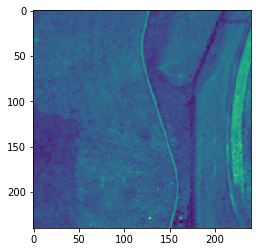

In [4]:
class DigitalGlobeDataset(Dataset):
    """DG Dataset"""
    def __init__(self, image_dir, transform=None):
        """ 
        Args:
            image_dir(string): the folder containing the DG images
            transform (callable, optional): Optional transform to  be applies
        """
        self.image_dir = image_dir
        self.transform = transform
        self.bgrn = [1,2,4,6]
        
    
    def __getitem__(self, idx):
        img_name = sorted(glob.glob(self.image_dir + '/*.tif'))[idx]
        img_arr = getDims(img_name)[1]
        
        new_shp = [4,240,240]
        img_arr = img_arr[self.bgrn,:,:] 
        img_arr = resize(img_arr, new_shp, preserve_range=True, mode='reflect')
        img_arr = img_arr / 1
        
        if self.transform:
            img_arr = self.transform(img_arr)
        
        return img_arr
    
dg_dataset = DigitalGlobeDataset(dg_dir)
sample = dg_dataset[1]
plt.imshow(sample[0,:,:])

### create a class for planetScope data which will do the following:
1. extract the image based on an index
2. divide by the reflectance precision factor of 10000

(4, 80, 80)


/home/jomc9287/anaconda3/envs/pytorch35/lib/python3.5/site-packages/ipykernel_launcher.py:15: FutureWarning: The value of this property will change in version 1.0. Please see https://github.com/mapbox/rasterio/issues/86 for details.
  from ipykernel import kernelapp as app


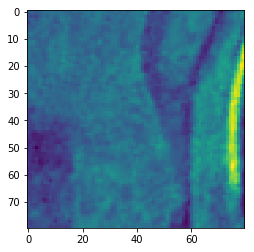

In [5]:
class PlanetScopeDataset(Dataset):
    """DG Dataset"""
    def __init__(self, image_dir, transform=None):
        """ 
        Args:
            image_dir(string): the folder containing the DG images
            transform (callable, optional): Optional transform to  be applies
        """
        self.image_dir = image_dir
        self.transform = transform
        
    
    def __getitem__(self, idx):
        img_name = sorted(glob.glob(self.image_dir + '/*.tif'))[idx]
        img_arr = getDims(img_name)[1]
        
        img_arr = img_arr / 1
        
        if self.transform:
            img_arr = self.transform(img_arr)
        
        return img_arr
    
pl_dataset = PlanetScopeDataset(planet_dir)
sample = pl_dataset[1]
plt.imshow(sample[0,:,:])
print(sample.shape)

#### make a class to transform the array to a tensor, and make the dataset calls use it


In [6]:
class ToTensor(object):
    """Convert ndarrays to Tensors... 
    NOTE: rasterio has band as first dim, no need for transpose
    """
    
    def __call__(self, img_arr):
        return torch.from_numpy(img_arr)
    
pl_T_dataset = PlanetScopeDataset(planet_dir, transform=transforms.Compose([ToTensor()]))
dg_T_dataset = DigitalGlobeDataset(dg_dir, transform=transforms.Compose([ToTensor()]))

dg_T_dataset[0].shape

/home/jomc9287/anaconda3/envs/pytorch35/lib/python3.5/site-packages/ipykernel_launcher.py:16: FutureWarning: The value of this property will change in version 1.0. Please see https://github.com/mapbox/rasterio/issues/86 for details.
  app.launch_new_instance()


torch.Size([4, 240, 240])

## create model class

In [8]:
# del model

class Net(nn.Module):
    def __init__(self, upscale_factor, NUMBER_OF_BANDS):
        super(Net, self).__init__()

        self.relu = nn.ReLU()
        self.conv1 = nn.Conv2d(NUMBER_OF_BANDS, 64, (5, 5), (1, 1), (2, 2))      # Here 
        self.conv2 = nn.Conv2d(64, 64, (3, 3), (1, 1), (1, 1))
        self.conv3 = nn.Conv2d(64, 32, (3, 3), (1, 1), (1, 1))
        self.conv4 = nn.Conv2d(32, ((NUMBER_OF_BANDS) * (upscale_factor ** 2)),  # And here
                               (3, 3), (1, 1), (1, 1))
        self.pixel_shuffle = nn.PixelShuffle(upscale_factor)

        self._initialize_weights()

    def forward(self, x):
        x = self.relu(self.conv1(x))
        x = self.relu(self.conv2(x))
        x = self.relu(self.conv3(x))
        x = self.pixel_shuffle(self.conv4(x))
        return x

    def _initialize_weights(self):
        init.orthogonal(self.conv1.weight, init.calculate_gain('relu'))
        init.orthogonal(self.conv2.weight, init.calculate_gain('relu'))
        init.orthogonal(self.conv3.weight, init.calculate_gain('relu'))
        init.orthogonal(self.conv4.weight)

## define the model for this case
model = Net(upscale_factor=3, NUMBER_OF_BANDS=4)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=.01) # learning rate is 0.01

cuda = torch.cuda.is_available()
if cuda:
    print('using GPU')
    model.cuda()
    criterion.cuda()
    

using GPU


## try the model

/home/jomc9287/anaconda3/envs/pytorch35/lib/python3.5/site-packages/ipykernel_launcher.py:15: FutureWarning: The value of this property will change in version 1.0. Please see https://github.com/mapbox/rasterio/issues/86 for details.
  from ipykernel import kernelapp as app


torch.Size([1, 4, 240, 240])


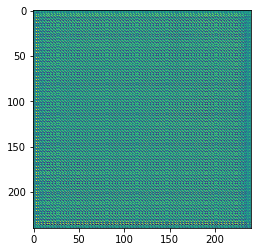

In [9]:
## this is the result in the randomly intialized state
test = Variable(pl_T_dataset[0].unsqueeze(0))
test = test.float()
test = test.cuda()
output = model(test)
print(output.size())

# visualize it
arr_random = output.data.cpu().numpy()
arr_random = arr_random.squeeze()
plt.imshow(arr_random[0,:,:])


### Before training the model, look at some image to pick some that have discernable features

In [ ]:
from pprint import pprint
for i in train_list[:100]:
    print(dg_files[i])
    print(planet_files[i])
    print('')

In [ ]:
training_list = train_list[1:100]
for j in training_list:
    plt.figure()
    plt.subplot(1,2,1)
    parr = pl_T_dataset[j].numpy()
    parr = parr.squeeze()
    plt.imshow(parr[0,:,:])
    plt.title(os.path.basename(planet_files[j]).split('_')[2])
    
    plt.subplot(1,2,2)
    darr = dg_T_dataset[j].numpy()
    darr = darr.squeeze()
    plt.imshow(darr[0,:,:])
    plt.title('index {}\n{}'.format(j, os.path.basename(dg_files[j]).split('_')[2]))
    
    plt.show()
    plt.clf()

### use a small training loop

In [12]:
num_it = 100
sample_ims = [1,2,3,4,5,6,7,10,11,12,13,14,15,20,22] # hand picked from plots above
training_list = train_list[:num_it+1]
epoch_loss = 0
random.shuffle(training_list) # shuffle the list
losses = []

## construct num_it tensors
for i in range(num_it):
    if i == 0:
        coarse_image_tensor = pl_T_dataset[training_list[i]].unsqueeze(0).float()
        fine_image_tensor = dg_T_dataset[training_list[i]].unsqueeze(0).float()
    else:
        coarse_image_tensor = torch.cat((coarse_image_tensor, pl_T_dataset[training_list[i]].unsqueeze(0).float()))
        fine_image_tensor = torch.cat((fine_image_tensor, dg_T_dataset[training_list[i]].unsqueeze(0).float()))

# for junk,i in enumerate(sample_ims):
#     if junk == 0:
#         coarse_image_tensor = pl_T_dataset[i].unsqueeze(0).float()
#         fine_image_tensor = dg_T_dataset[i].unsqueeze(0).float()
#     else:
#         coarse_image_tensor = torch.cat((coarse_image_tensor, pl_T_dataset[i].unsqueeze(0).float()))
#         fine_image_tensor = torch.cat((fine_image_tensor, dg_T_dataset[i].unsqueeze(0).float()))

num_epochs = 3000        
for iteration in range(3000):
    input, target = Variable(coarse_image_tensor), Variable(fine_image_tensor)

    if cuda:
        input = input.cuda()
        target = target.cuda()    

    optimizer.zero_grad()
    loss = criterion(model(input), target)
    losses.append(loss.data[0])
    epoch_loss += loss.data[0]
    loss.backward()
    optimizer.step()

    if iteration%100 == 0:
        print("loss on iteration {}: {}".format(iteration,loss.data[0]))

# for iteration, ind in enumerate(training_list):
#     input, target = Variable(pl_T_dataset[ind].unsqueeze(0).float()), \
#                     Variable(dg_T_dataset[ind].unsqueeze(0).float())

#     if cuda:
#         input = input.cuda()
#         target = target.cuda()

    
#     ## update 1000x per image
#     for i in range(1000):
#         optimizer.zero_grad()
#         loss = criterion(model(input), target)
#         losses.append(loss.data[0])
#         epoch_loss += loss.data[0]
#         loss.backward()
#         optimizer.step()
    
#     if iteration%100 == 0:
#         print("loss on iteration {}: {}".format(iteration,loss.data[0]))

model_out_path = "/media/jomc9287/Data/pytorch_SSIR_jdiaz/pytorch_outputs_chips_100/model_small_{}_iters.pth".format(num_it)
torch.save(model, model_out_path)
print("Checkpoint saved to {}".format(model_out_path))

/home/jomc9287/anaconda3/envs/pytorch35/lib/python3.5/site-packages/ipykernel_launcher.py:15: FutureWarning: The value of this property will change in version 1.0. Please see https://github.com/mapbox/rasterio/issues/86 for details.
  from ipykernel import kernelapp as app
/home/jomc9287/anaconda3/envs/pytorch35/lib/python3.5/site-packages/ipykernel_launcher.py:16: FutureWarning: The value of this property will change in version 1.0. Please see https://github.com/mapbox/rasterio/issues/86 for details.
  app.launch_new_instance()


loss on iteration 0: 4387337.5
loss on iteration 100: 221885.796875
loss on iteration 200: 216417.9375
loss on iteration 300: 214322.765625
loss on iteration 400: 217809.9375
loss on iteration 500: 211305.90625
loss on iteration 600: 210126.234375
loss on iteration 700: 209502.15625
loss on iteration 800: 208452.125
loss on iteration 900: 210229.59375
loss on iteration 1000: 207974.609375
loss on iteration 1100: 208154.078125
loss on iteration 1200: 206124.59375
loss on iteration 1300: 205033.546875
loss on iteration 1400: 204339.5
loss on iteration 1500: 205050.109375
loss on iteration 1600: 203094.578125
loss on iteration 1700: 202848.453125
loss on iteration 1800: 208983.515625
loss on iteration 1900: 202275.4375
loss on iteration 2000: 206348.171875
loss on iteration 2100: 203665.140625
loss on iteration 2200: 203962.875
loss on iteration 2300: 203701.953125
loss on iteration 2400: 204823.171875
loss on iteration 2500: 201864.578125
loss on iteration 2600: 201471.21875
loss on iter

/home/jomc9287/anaconda3/envs/pytorch35/lib/python3.5/site-packages/torch/serialization.py:159: UserWarning: Couldn't retrieve source code for container of type Net. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


In [ ]:
input.shape

In [ ]:
## plot the loss, the randomly initialized data, and the model output for the same data
plt.figure(figsize=(10,10))
plt.plot(losses)
plt.title('Model Loss')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.show()
plt.clf()

# images
plt.figure(figsize=(20, 5))
plt.subplot(1,3,1)
plt.imshow(arr_random[0,:,:])
plt.title('randomly initialized state\n no training')

plt.subplot(1,3,2)
test = Variable(pl_T_dataset[0].unsqueeze(0))
test = test.float()
test = test.cuda()
output = model(test)
arr_train = output.data.cpu().numpy()
arr_train = arr_train.squeeze()
plt.imshow(arr_train[0,:,:])
plt.title('after 1000 iterations')

plt.subplot(1,3,3)
diff = arr_train[0,:,:] - arr_random[0,:,:]
plt.hist(diff.ravel())
plt.show()

plt.tight_layout()
plt.clf()


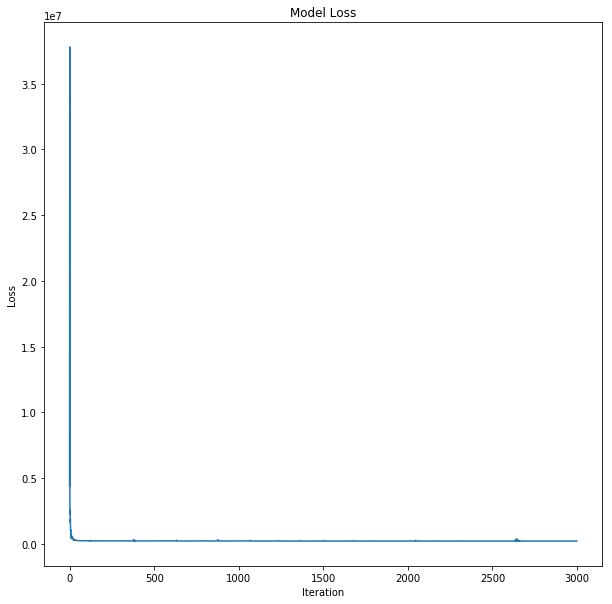

/home/jomc9287/anaconda3/envs/pytorch35/lib/python3.5/site-packages/ipykernel_launcher.py:16: FutureWarning: The value of this property will change in version 1.0. Please see https://github.com/mapbox/rasterio/issues/86 for details.
  app.launch_new_instance()
/home/jomc9287/anaconda3/envs/pytorch35/lib/python3.5/site-packages/ipykernel_launcher.py:16: DeprecationWarning: `bytescale` is deprecated!
`bytescale` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
  app.launch_new_instance()
/home/jomc9287/anaconda3/envs/pytorch35/lib/python3.5/site-packages/ipykernel_launcher.py:15: FutureWarning: The value of this property will change in version 1.0. Please see https://github.com/mapbox/rasterio/issues/86 for details.
  from ipykernel import kernelapp as app
/home/jomc9287/anaconda3/envs/pytorch35/lib/python3.5/site-packages/ipykernel_launcher.py:26: DeprecationWarning: `bytescale` is deprecated!
`bytescale` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
/home/jomc9

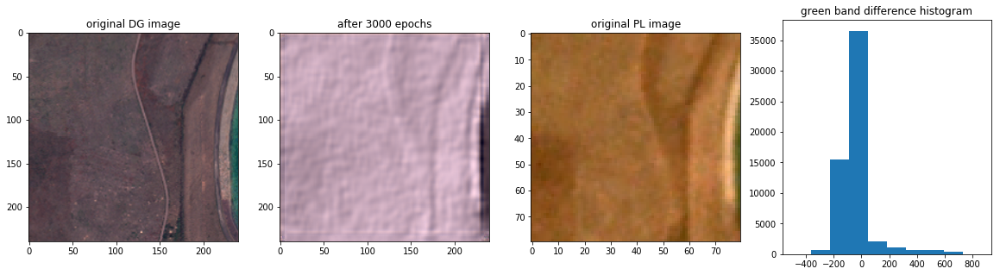

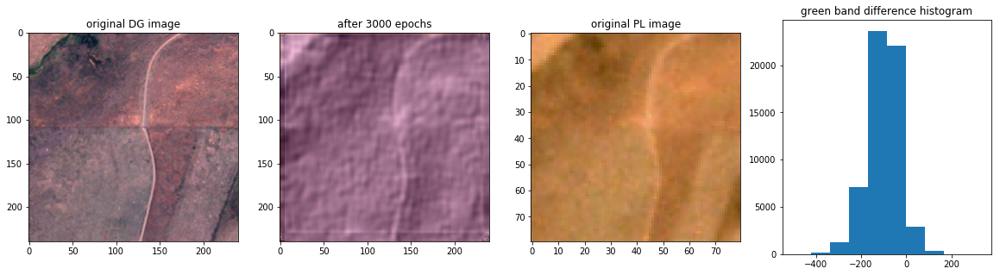

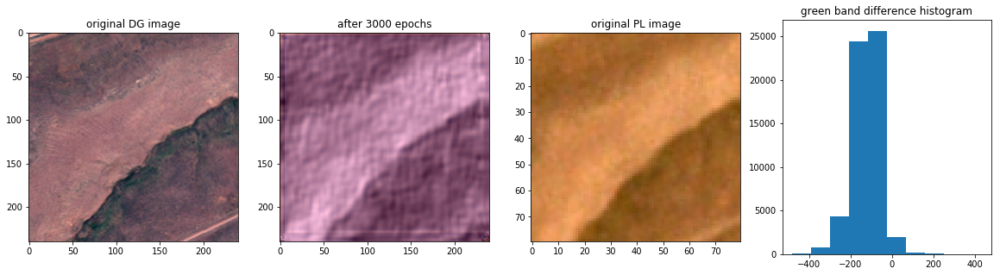

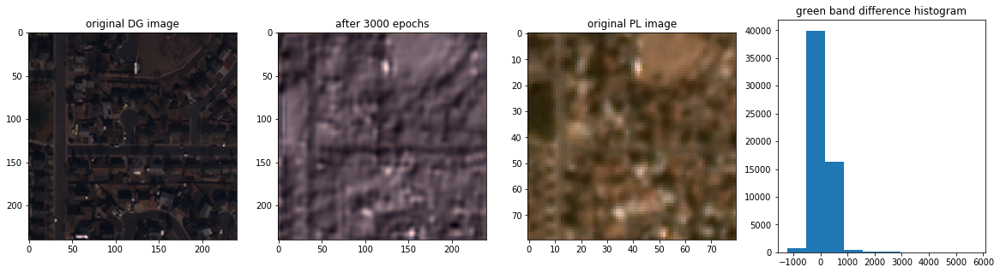

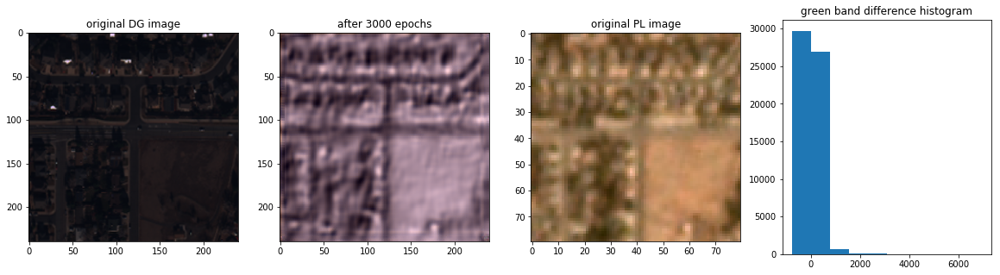

...

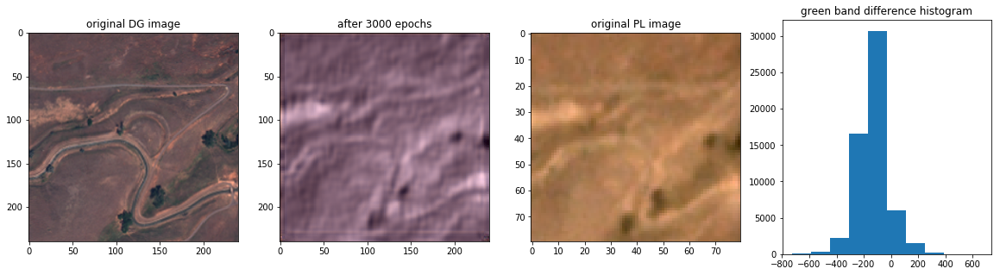

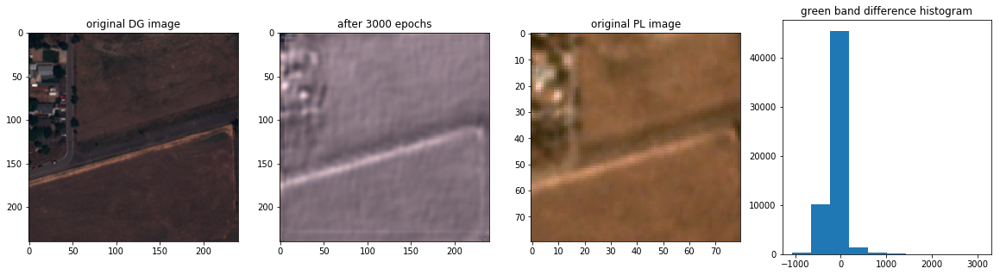

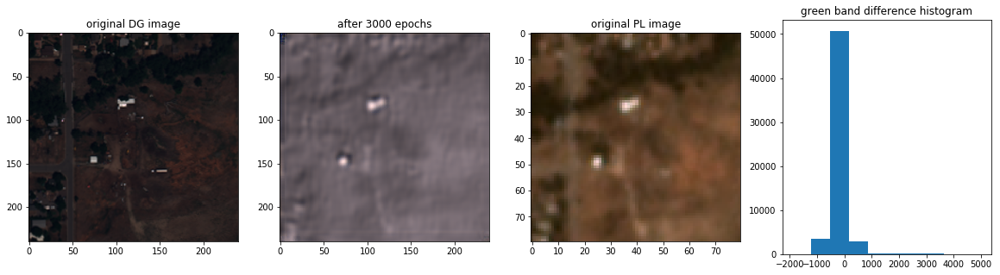

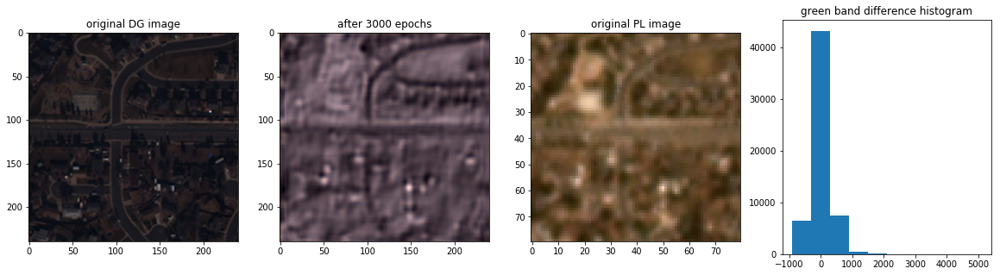

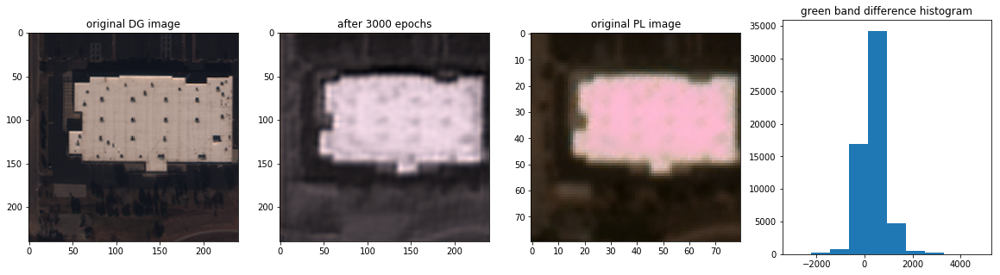

In [19]:
## plot the loss, the randomly initialized data, and the model output for the same data
plt.figure(figsize=(10,10))
plt.plot(losses)
plt.title('Model Loss')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.show()
plt.clf()

# images
for ind in sample_ims:
    plt.figure(figsize=(20, 5))
    plt.subplot(1,4,1)
    dg_im = dg_T_dataset[ind].numpy()
    dg_im = dg_im.squeeze()
    plt.imshow(misc.bytescale(np.rollaxis(dg_im[[2,1,0],:,:], 0, 3)))
    plt.title('original DG image')

    plt.subplot(1,4,2)
    test = Variable(pl_T_dataset[ind].unsqueeze(0))
    test = test.float()
    test = test.cuda()
    output = model(test)
    arr_train = output.data.cpu().numpy()
    arr_train = arr_train.squeeze()
    plt.imshow(misc.bytescale(np.rollaxis(arr_train[[2,1,0],:,:], 0, 3)))
    plt.title('after {} epochs'.format(num_epochs))

    plt.subplot(1,4,3)
    pl_im = pl_T_dataset[ind].numpy()
    pl_im = pl_im.squeeze()
    plt.imshow(misc.bytescale(np.rollaxis(pl_im[[2,1,0],:,:], 0, 3)))
    plt.title('original PL image')

    plt.subplot(1,4,4)
    diff = dg_im[1,:,:] - arr_train[1,:,:]
    plt.hist(diff.ravel())
    plt.title('green band difference histogram')
    plt.show()

    plt.tight_layout()
    plt.clf()
    

/home/jomc9287/anaconda3/envs/pytorch35/lib/python3.5/site-packages/ipykernel_launcher.py:16: FutureWarning: The value of this property will change in version 1.0. Please see https://github.com/mapbox/rasterio/issues/86 for details.
  app.launch_new_instance()
/home/jomc9287/anaconda3/envs/pytorch35/lib/python3.5/site-packages/ipykernel_launcher.py:13: DeprecationWarning: `bytescale` is deprecated!
`bytescale` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
  del sys.path[0]
/home/jomc9287/anaconda3/envs/pytorch35/lib/python3.5/site-packages/ipykernel_launcher.py:15: FutureWarning: The value of this property will change in version 1.0. Please see https://github.com/mapbox/rasterio/issues/86 for details.
  from ipykernel import kernelapp as app
/home/jomc9287/anaconda3/envs/pytorch35/lib/python3.5/site-packages/ipykernel_launcher.py:24: DeprecationWarning: `bytescale` is deprecated!
`bytescale` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
/home/jomc9287/anacon

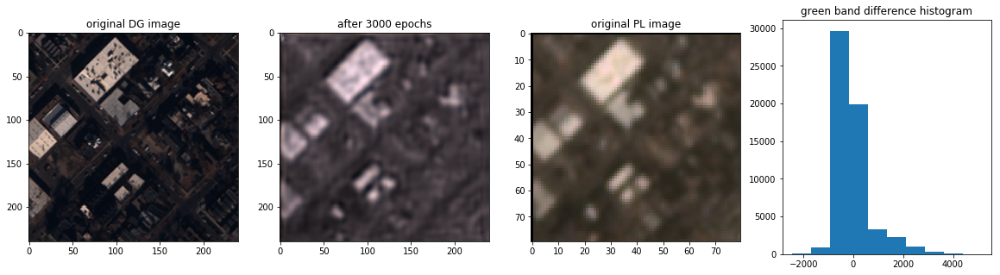

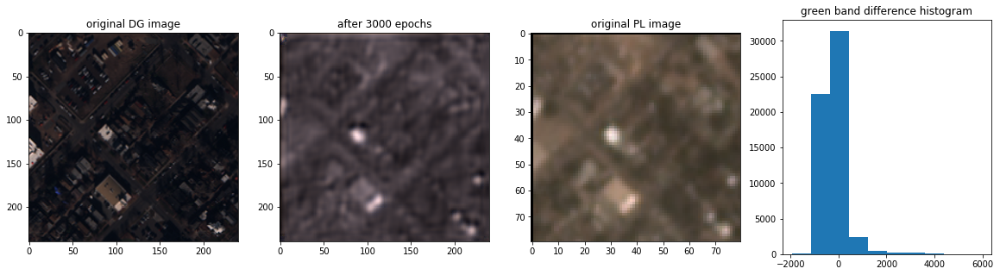

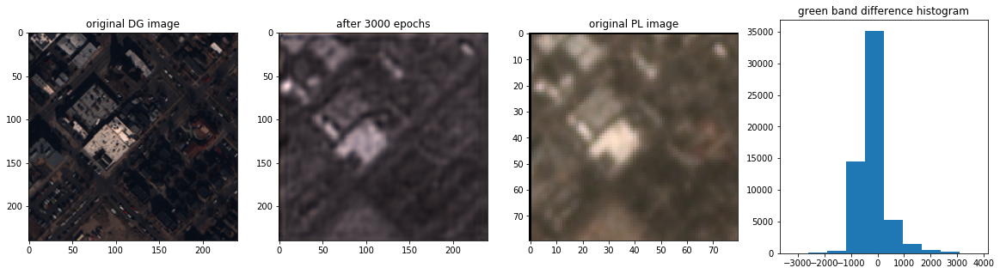

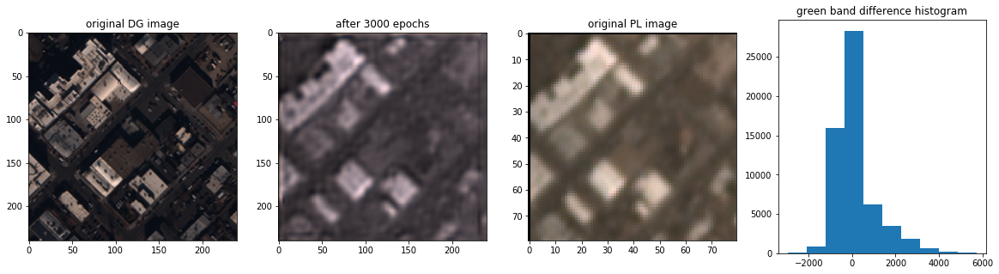

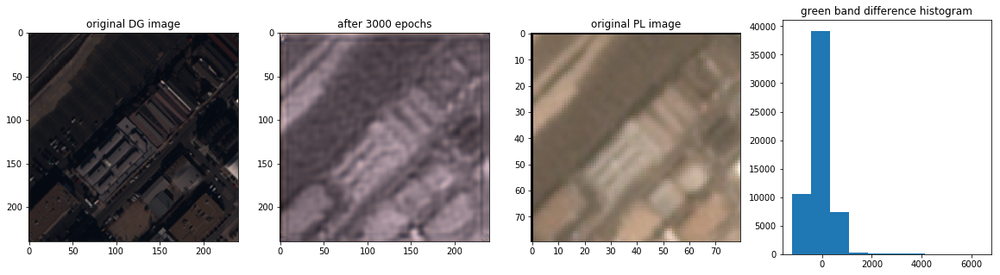

...

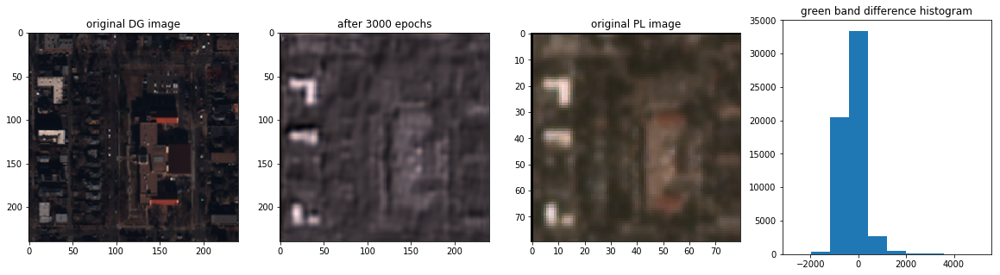

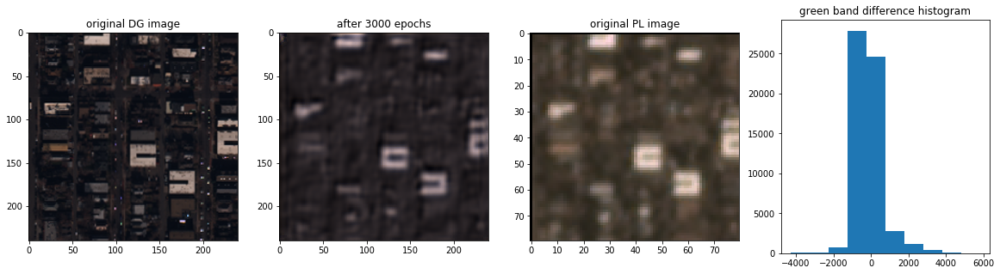

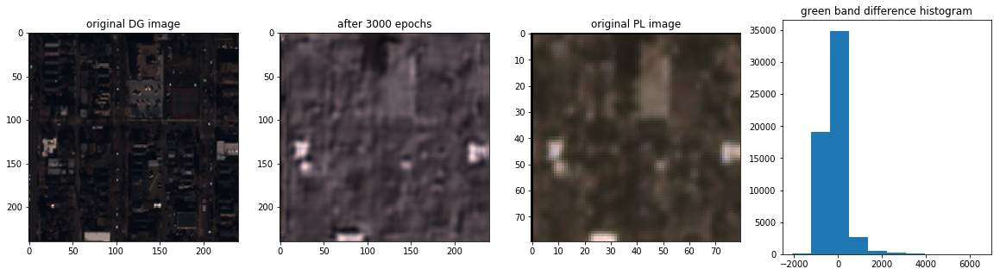

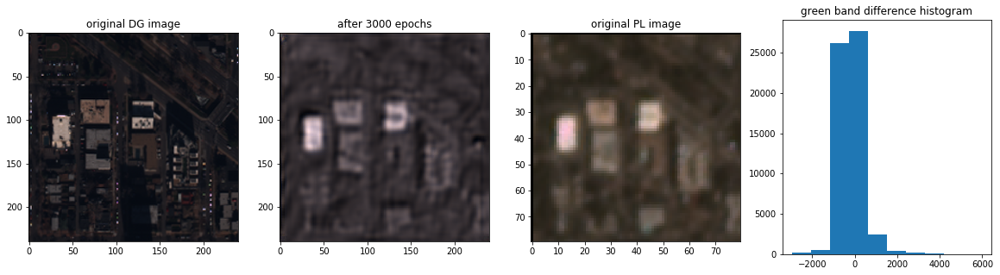

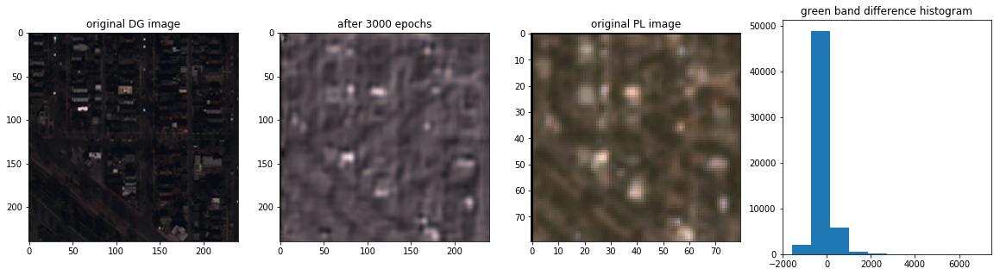

In [18]:
## try it for some of the validation data
start = 10
step = 20
stop = start + step
ids = val_list[start:stop]
# images
for ind in ids:
    plt.figure(figsize=(20, 5))
    plt.subplot(1,4,1)
    dg_im = dg_T_dataset[ind].numpy()
    dg_im = dg_im.squeeze()
    #plt.imshow(dg_im[0,:,:])
    plt.imshow(misc.bytescale(np.rollaxis(dg_im[[2,1,0],:,:],0,3)))
    plt.title('original DG image')

    plt.subplot(1,4,2)
    test = Variable(pl_T_dataset[ind].unsqueeze(0))
    test = test.float()
    test = test.cuda()
    output = model(test)
    arr_train = output.data.cpu().numpy()
    arr_train = arr_train.squeeze()
    #plt.imshow(arr_train[0,:,:])
    plt.imshow(misc.bytescale(np.rollaxis(arr_train[[2,1,0],:,:],0,3)))
    plt.title('after {} epochs'.format(num_epochs))

    plt.subplot(1,4,3)
    pl_im = pl_T_dataset[ind].numpy()
    pl_im = pl_im.squeeze()
    plt.imshow(misc.bytescale(np.rollaxis(pl_im[[2,1,0],:,:],0,3)))
    plt.title('original PL image')

    plt.subplot(1,4,4)
    diff = dg_im[1,:,:] - arr_train[1,:,:]
    plt.hist(diff.ravel())
    plt.title('green band difference histogram')
    plt.show()

    plt.tight_layout()
    plt.clf()

### use the PyTorch super-resolution example for training

In [ ]:
full_data = False
if full_data:
    def train(epoch, training_list, input_dataset, target_dataset):  # updated to include list of inds, Datasets
        epoch_loss = 0
    #     for iteration, batch in enumerate(training_data_loader, 1):
    #         input, target = Variable(batch[0]), Variable(batch[1])

        random.shuffle(training_list) # shuffle the list
        for iteration, ind in enumerate(training_list):
            input, target = Variable(input_dataset[ind].unsqueeze(0).float()), \
                            Variable(target_dataset[ind].unsqueeze(0).float())

            if cuda:
                input = input.cuda()
                target = target.cuda()

            optimizer.zero_grad()
            loss = criterion(model(input), target)
            epoch_loss += loss.data[0]
            loss.backward()
            optimizer.step()

            print("===> Epoch[{}]({}/{}): Loss: {:.4f}".format(epoch, iteration, len(training_list), loss.data[0]))

        print("===> Epoch {} Complete: Avg. Loss: {:.4f}".format(epoch, epoch_loss / len(training_list)))


    def test(testing_list, input_dataset, target_dataset):
        avg_psnr = 0
        #     for batch in testing_data_loader:
        #         input, target = Variable(batch[0]), Variable(batch[1])

        random.shuffle(testing_list)
        for iteration, ind in enumerate(testing_list):
            input, target = Variable(input_dataset[ind].unsqueeze(0).float()), \
                        Variable(target_dataset[ind].unsqueeze(0).float())
            if cuda:
                input = input.cuda()
                target = target.cuda()

            prediction = model(input)
            mse = criterion(prediction, target)
            psnr = 10 * log10(1 / mse.data[0])
            avg_psnr += psnr

        print("===> Avg. PSNR: {:.4f} dB".format(avg_psnr / len(testing_list)))


    def checkpoint(epoch):
        model_out_path = "/media/jomc9287/Data/pytorch_SSIR_jdiaz/pytorch_outputs/model_epoch_{}.pth".format(epoch)
        torch.save(model, model_out_path)
        print("Checkpoint saved to {}".format(model_out_path))

In [ ]:
if full_data:
    # define the number of epochs
    num_epochs = 2 ## each epoch should take 1.13 days!!!
    test(test_list, pl_T_dataset, dg_T_dataset)
    for epoch in range(1, num_epochs + 1):
        train(epoch, train_list, pl_T_dataset, dg_T_dataset)
        test(test_list, pl_T_dataset, dg_T_dataset)
        checkpoint(epoch)

### check out some of the validation set

In [ ]:
# create some sample indices
val_samples = np.random.rand(5)*1000
val_samples = list(val_samples.astype('uint8'))

val_results = []
for idx in val_samples:
    
    # get the validation set index
    samp_idx = val_list[idx]
    
    # extract the planet and DG images
    pl_im = pl_T_dataset[samp_idx] 
    dg_im = dg_T_dataset[samp_idx]
    
    # assign them to PyTorch Variables
    input, target = Variable(pl_im.unsqueeze(0).float()), \
                    Variable(dg_im.unsqueeze(0).float())
    
    # is using the GPU, put on the GPU
    if cuda:
            input = input.cuda()
            target = target.cuda()

    # make the super-resolution prediction
    prediction = model(input)
    
    # convert tensors to numpy arrays for plotting
    pl_arr = input.data.cpu().numpy()
    pl_arr = pl_arr.squeeze()
    
    dg_arr = target.data.cpu().numpy()
    dg_arr = dg_arr.squeeze()
    
    sr_arr = prediction.data.cpu().numpy()
    sr_arr = sr_arr.squeeze()
    val_results.append(sr_arr)
    
    ## plot the figure    
    plt.subplot(1,3,1)
    plt.imshow(pl_arr[3,:,:])
    plt.title('Original Planet Image')
    
    plt.subplot(1,3,2)
    plt.imshow(dg_arr[3,:,:])
    plt.title('Original DG Image')
    
    plt.subplot(1,3,3)
    plot_im = misc.bytescale(np.rollaxis(sr_arr[[2,1,0],:,:], 0,3))
    plt.imshow(plot_im)
    plt.title('SR Planet Image')
    
    plt.show()
    
    

In [ ]:
# look at some histograms
plt.hist(val_results[3][0,:,:].ravel(), histtype='bar')
plt.show()

# print the sum of a difference image... they are exactly the same! and thus the difference sums to zero.
# not good.
print(np.sum(val_results[1][0,:,:] - val_results[2][0,:,:]))



# Appendix: Code that wasn't used

In [ ]:
## read the data for all of the files
# training_pl = [getDims(f) for f in planet_files[:train_len+1]]
# test_pl = [getDims(f) for f in planet_files[train_len:train_len + test_len + 1]]
# validation_pl = [getDims(f) for f in planet_files[train_len + test_len:]]

# training_dg = [getDims(f) for f in dg_files[:train_len+1]]
# test_dg = [getDims(f) for f in dg_files[train_len:train_len + test_len + 1]]
# validation_dg = [getDims(f) for f in dg_files[train_len + test_len:]]

In [ ]:
## need to extract the BGRN bands from the DG arrays
# bgrn = [1,2,4,6]
# training_dg_arr = [tup[1][bgrn,:,:] for tup in training_dg]
# test_dg_arr = [tup[1][bgrn,:,:] for tup in test_dg]
# validation_dg_arr = [tup[1][bgrn,:,:] for tup in validation_dg]

In [ ]:
## then, need to resize DG arrays to planet array shapes
# pl_shp = training_pl[0][1].shape
# upscale_factor = 3
# new_shp = (pl_shp[0], pl_shp[1]*upscale_factor, pl_shp[2]*upscale_factor)
# training_dg_rs = [resize(im, new_shp, preserve_range=True, mode='reflect') for im in training_dg_arr]
# test_dg_rs = [resize(im, new_shp, preserve_range=True, mode='reflect') for im in test_dg_arr]
# validation_dg_rs = [resize(im, new_shp, preserve_range=True, mode='reflect') for im in validation_dg_arr]

In [ ]:
## extract the planet arrays
# training_pl_arr = [tup[1] for tup in training_pl]
# test_pl_arr = [tup[1] for tup in test_pl]
# validation_pl_arr = [tup[1] for tup in validation_pl]

### need to normalize the data in the array by something... max()? Maximum bit value, e.g., 2^11?

In [ ]:
# scale_factor = 10000 # this is used to normalize to surface reflectance as per file metadata
# trX = torch.from_numpy(np.asarray(training_pl_arr).astype('float')) / scale_factor
# trY = torch.from_numpy(np.asarray(training_dg_rs).astype('float')) / scale_factor

# teX = torch.from_numpy(np.asarray(test_pl_arr).astype('float')) / scale_factor
# teY = torch.from_numpy(np.asarray(test_dg_rs).astype('float')) / scale_factor

# valX = torch.from_numpy(np.asarray(validation_pl_arr).astype('float')) / scale_factor
# valY = torch.from_numpy(np.asarray(validation_dg_rs).astype('float')) / scale_factor

In [ ]:
## test the model
# testing = valX[0].unsqueeze(0) # the .unsqueeze(0) ensure batch dim == 1, eg., [1,bands,rows,cols]
# testing = Variable(testing)
# testing = testing.float()
# output = model(testing)
# print(output.size())

# # visualize it
# arr_random = output.data.numpy()
# arr_random = arr.squeeze()
# # plt.imshow(arr[0,:,:])